# Check ICA
The main purpose of the code in this notebook is to identify noise components in the ICA solutions generated in 'run_ica.py'


- Laura: 0108 + 0110
- Aleks: 0109 + 0111
- Luke: 0112 + 0113
- Pernille: 0114
- Christoffer: 0115

In [148]:
import mne
import json
import os
from pathlib import Path

# loading in the txt file with the channels that should be labeled as bad channels
with open('../session_info.txt', 'r') as f:
    file = f.read()
    session_info = json.loads(file)


In [149]:
MEG_data_path = Path("/work/834761")
subject = "0111"
subject_folder = "20230926_000000"
recording_name = ['001.self_block1',  '002.other_block1', '003.self_block2',  '004.other_block2', '005.self_block3',  '006.other_block3'][5]
ICA_path = Path("/work/study_group_8/ICA") / subject / f"{recording_name}-ica.fif"

# get the fif file in the folder by listing files in path
fif_file_path = list((MEG_data_path / subject / subject_folder / "MEG" / recording_name / "files").glob("*.fif"))[0]

In [150]:
# Loading in the raw data
raw = mne.io.read_raw_fif(fif_file_path, on_split_missing='warn');
raw.load_data();
raw.pick_types(meg=True, eeg=False, stim=True)

### EXCLUDING BAD CHANNELS ###
# using dict[] notation to get the bad channels for the specific file. Not using dict.get() as this does not raise a key-error if the key does not exist
bad_channels_file = session_info[subject][recording_name]['bad_channels']

# marking the channels as bad
raw.info['bads'] = bad_channels_file

# cropping beginning and end of recording
tmin = session_info[subject][recording_name]['tmin']
tmax = session_info[subject][recording_name]['tmax']

cropped = raw.copy().crop(tmin = tmin, tmax = tmax)
del raw

### HIGH PASS FILTERING ###
filt_raw = cropped.copy().filter(l_freq=1, h_freq=40)
del cropped

### ICA ###
ica = mne.preprocessing.read_ica(ICA_path)
ica.apply(filt_raw)

Opening raw data file /work/834761/0111/20230926_000000/MEG/006.other_block3/files/other_block3.fif...
    Read a total of 9 projection items:
        planar-Raw-0.000-120.000-PCA-01 (1 x 203)  idle
        planar-Raw-0.000-120.000-PCA-02 (1 x 203)  idle
        planar-Raw-0.000-120.000-PCA-03 (1 x 203)  idle
        axial-Raw-0.000-120.000-PCA-01 (1 x 102)  idle
        axial-Raw-0.000-120.000-PCA-02 (1 x 102)  idle
        axial-Raw-0.000-120.000-PCA-03 (1 x 102)  idle
        axial-Raw-0.000-120.000-PCA-04 (1 x 102)  idle
        axial-Raw-0.000-120.000-PCA-05 (1 x 102)  idle
        axial-Raw-0.000-120.000-PCA-06 (1 x 102)  idle
    Range : 50000 ... 425999 =     50.000 ...   425.999 secs
Ready.
Reading 0 ... 375999  =      0.000 ...   375.999 secs...


/tmp/ipykernel_2901/1087389719.py:2: RuntimeWarning: This filename (/work/834761/0111/20230926_000000/MEG/006.other_block3/files/other_block3.fif) does not conform to MNE naming conventions. All raw files should end with raw.fif, raw_sss.fif, raw_tsss.fif, _meg.fif, _eeg.fif, _ieeg.fif, raw.fif.gz, raw_sss.fif.gz, raw_tsss.fif.gz, _meg.fif.gz, _eeg.fif.gz or _ieeg.fif.gz
  raw = mne.io.read_raw_fif(fif_file_path, on_split_missing='warn');


NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 3301 samples (3.301 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.8s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    1.8s
[Parallel(n_jobs=1)]: Done 287 tasks      | elapsed:    3.3s


Reading /work/study_group_8/ICA/0111/006.other_block3-ica.fif ...
    Read a total of 9 projection items:
        planar-Raw-0.000-120.000-PCA-01 (1 x 203)  idle
        planar-Raw-0.000-120.000-PCA-02 (1 x 203)  idle
        planar-Raw-0.000-120.000-PCA-03 (1 x 203)  idle
        axial-Raw-0.000-120.000-PCA-01 (1 x 102)  idle
        axial-Raw-0.000-120.000-PCA-02 (1 x 102)  idle
        axial-Raw-0.000-120.000-PCA-03 (1 x 102)  idle
        axial-Raw-0.000-120.000-PCA-04 (1 x 102)  idle
        axial-Raw-0.000-120.000-PCA-05 (1 x 102)  idle
        axial-Raw-0.000-120.000-PCA-06 (1 x 102)  idle
Now restoring ICA solution ...
Ready.
Applying ICA to Raw instance
    Transforming to ICA space (208 components)
    Zeroing out 0 ICA components
    Projecting back using 305 PCA components


<Raw | other_block3.fif, 307 x 361000 (361.0 s), ~850.7 MB, data loaded>

Displaying components 0-19
Creating RawArray with float64 data, n_channels=20, n_times=361000
    Range : 65000 ... 425999 =     65.000 ...   425.999 secs
Ready.


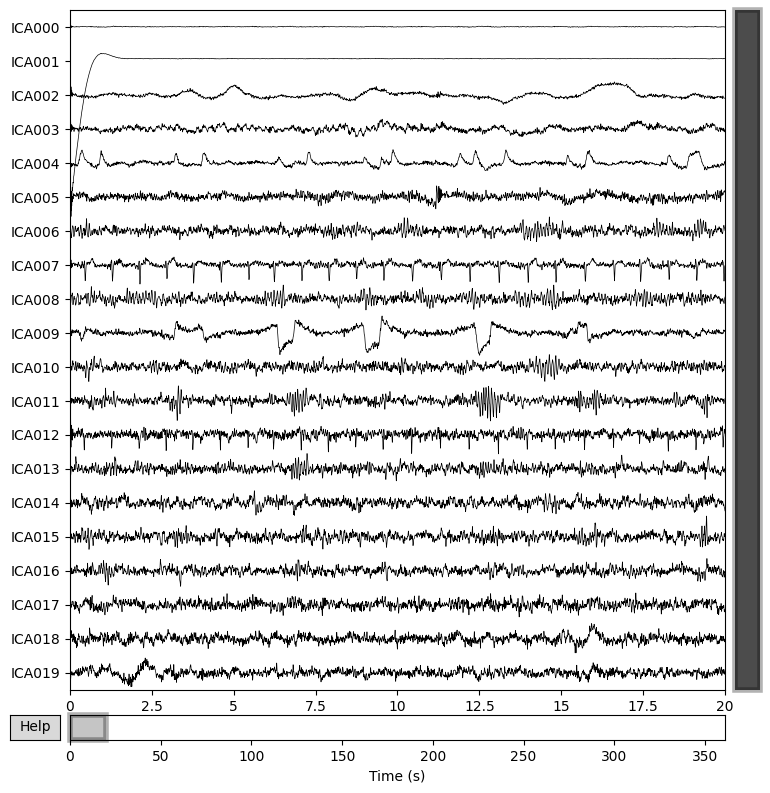

Displaying components 20-39
Creating RawArray with float64 data, n_channels=20, n_times=361000
    Range : 65000 ... 425999 =     65.000 ...   425.999 secs
Ready.


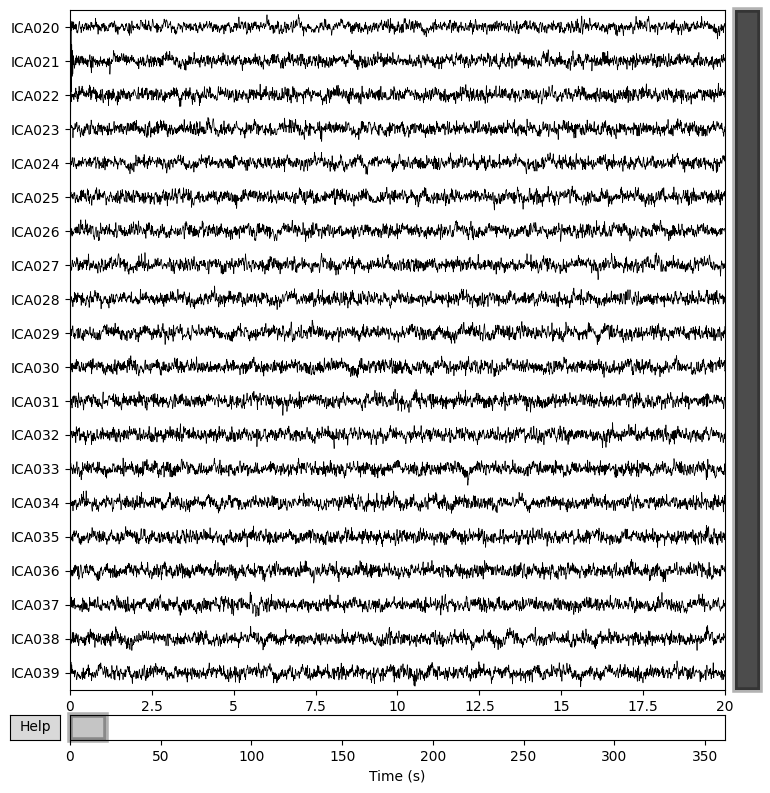

Displaying components 40-59
Creating RawArray with float64 data, n_channels=20, n_times=361000
    Range : 65000 ... 425999 =     65.000 ...   425.999 secs
Ready.


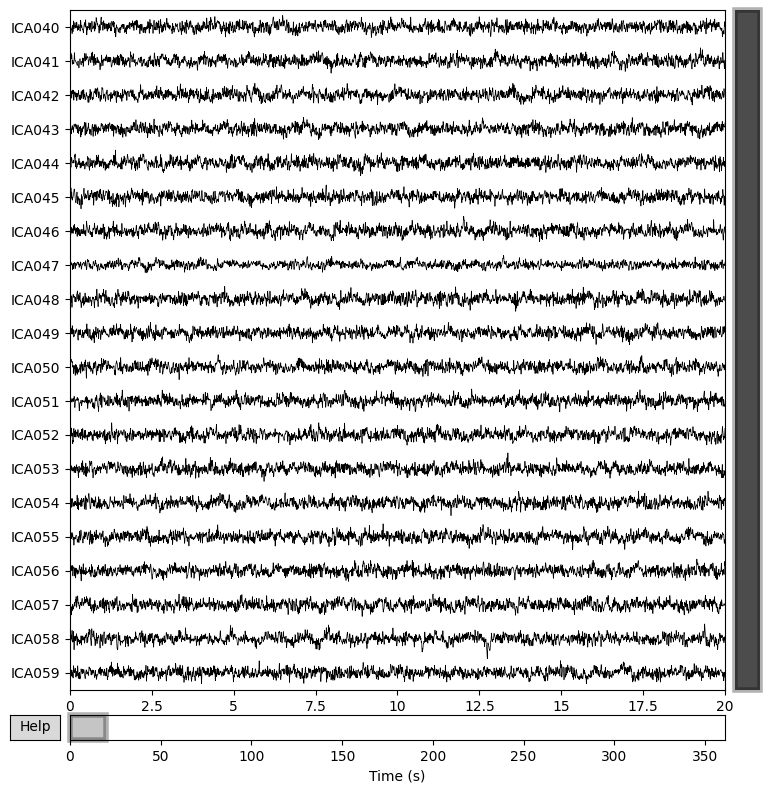

Displaying components 60-79
Creating RawArray with float64 data, n_channels=20, n_times=361000
    Range : 65000 ... 425999 =     65.000 ...   425.999 secs
Ready.


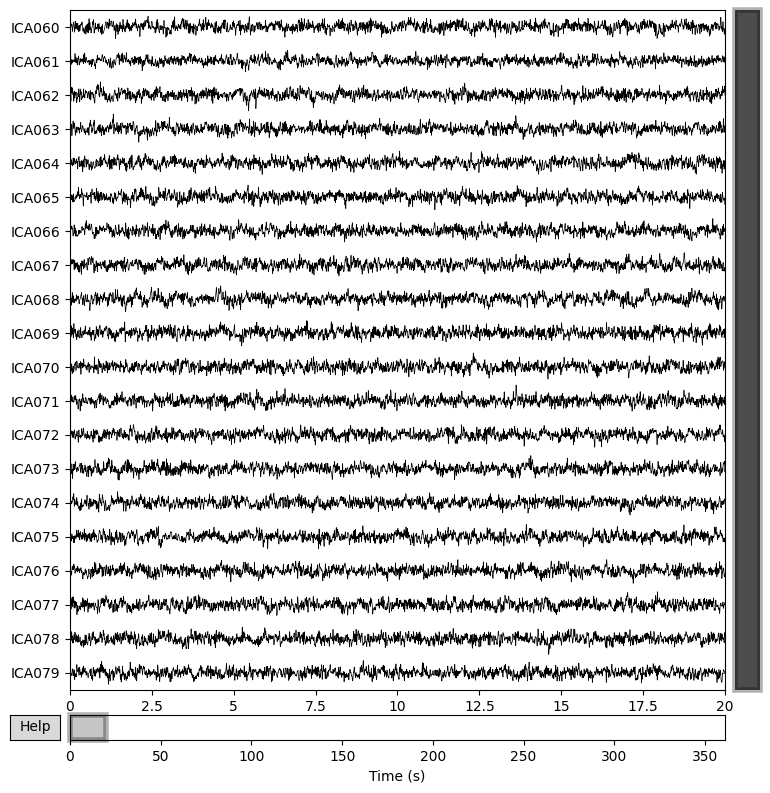

Displaying components 80-99
Creating RawArray with float64 data, n_channels=20, n_times=361000
    Range : 65000 ... 425999 =     65.000 ...   425.999 secs
Ready.


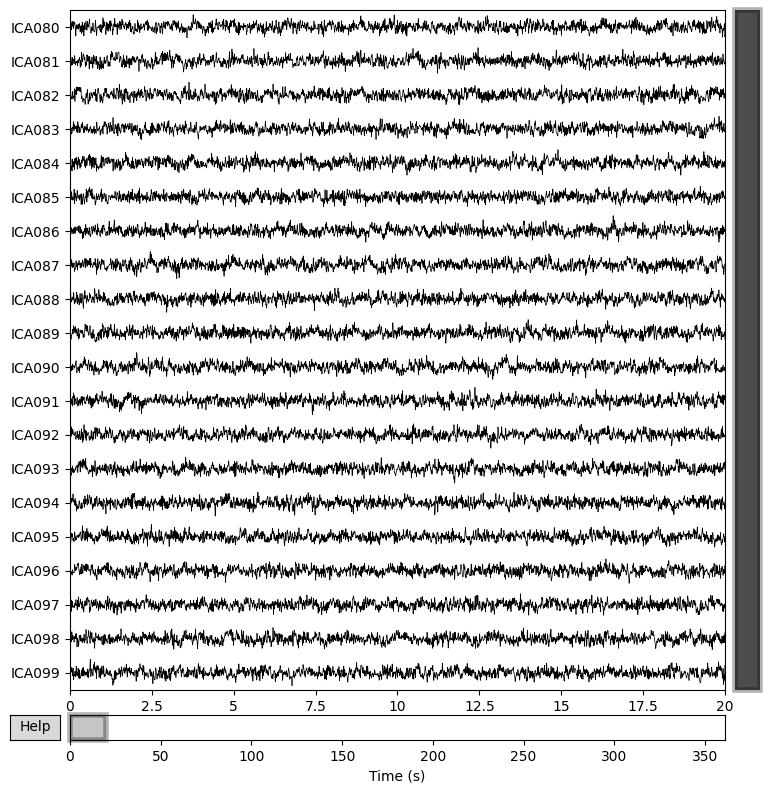

Displaying components 100-119
Creating RawArray with float64 data, n_channels=20, n_times=361000
    Range : 65000 ... 425999 =     65.000 ...   425.999 secs
Ready.


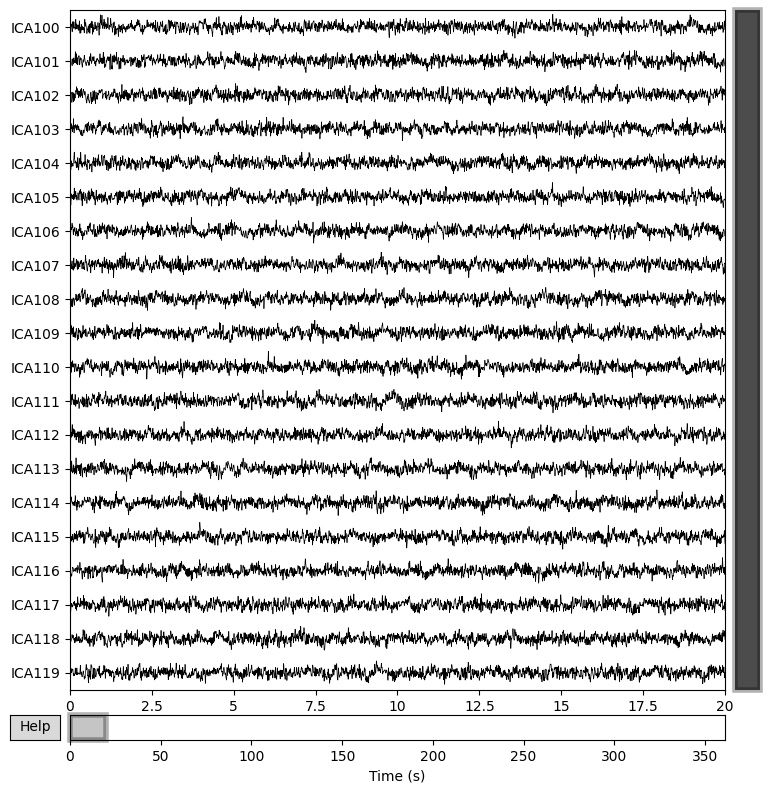

Displaying components 120-139


Creating RawArray with float64 data, n_channels=20, n_times=361000
    Range : 65000 ... 425999 =     65.000 ...   425.999 secs
Ready.


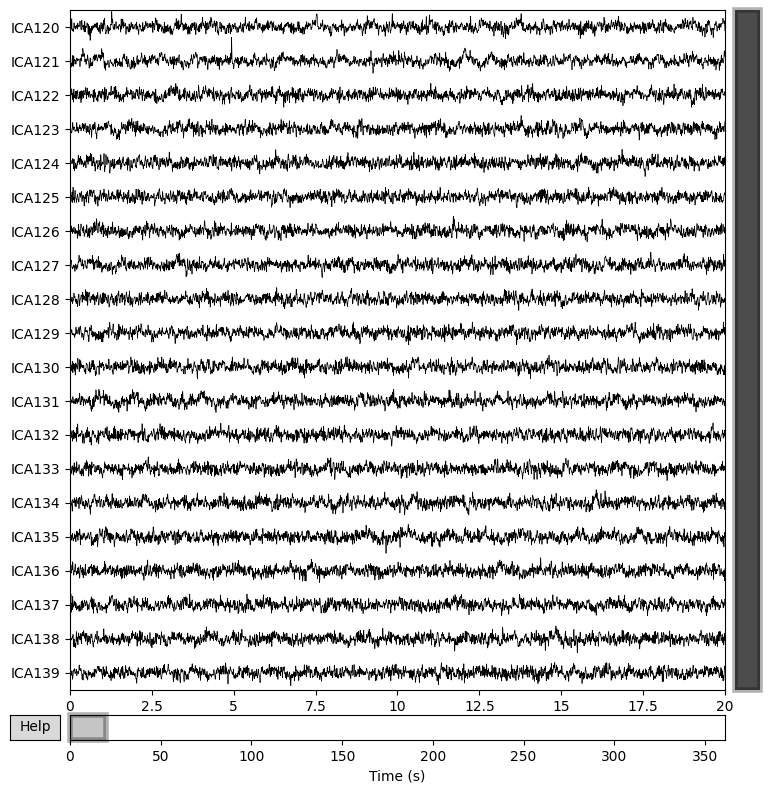

Displaying components 140-159
Creating RawArray with float64 data, n_channels=20, n_times=361000
    Range : 65000 ... 425999 =     65.000 ...   425.999 secs
Ready.


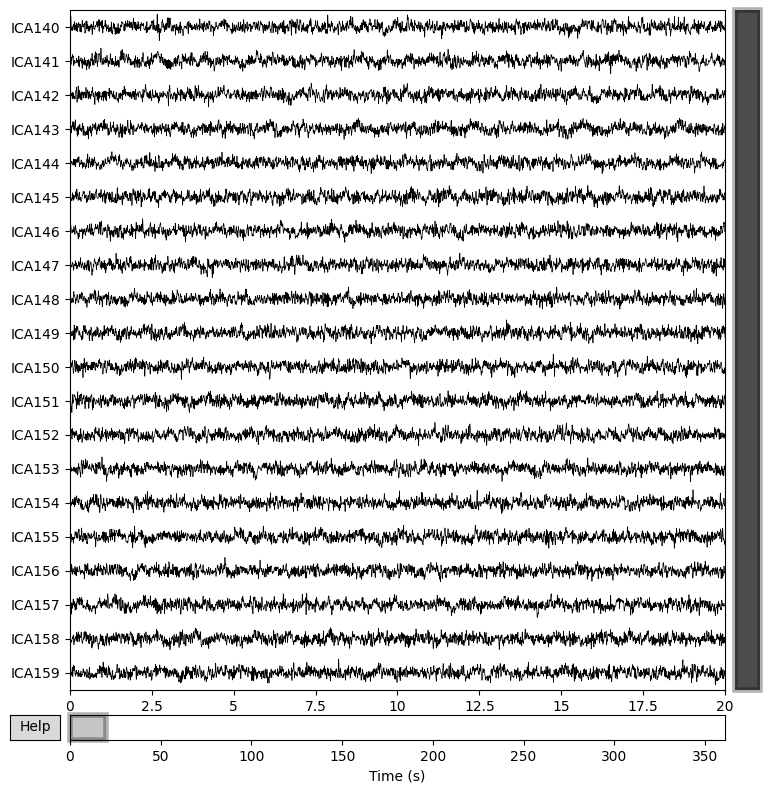

Displaying components 160-179
Creating RawArray with float64 data, n_channels=20, n_times=361000
    Range : 65000 ... 425999 =     65.000 ...   425.999 secs
Ready.


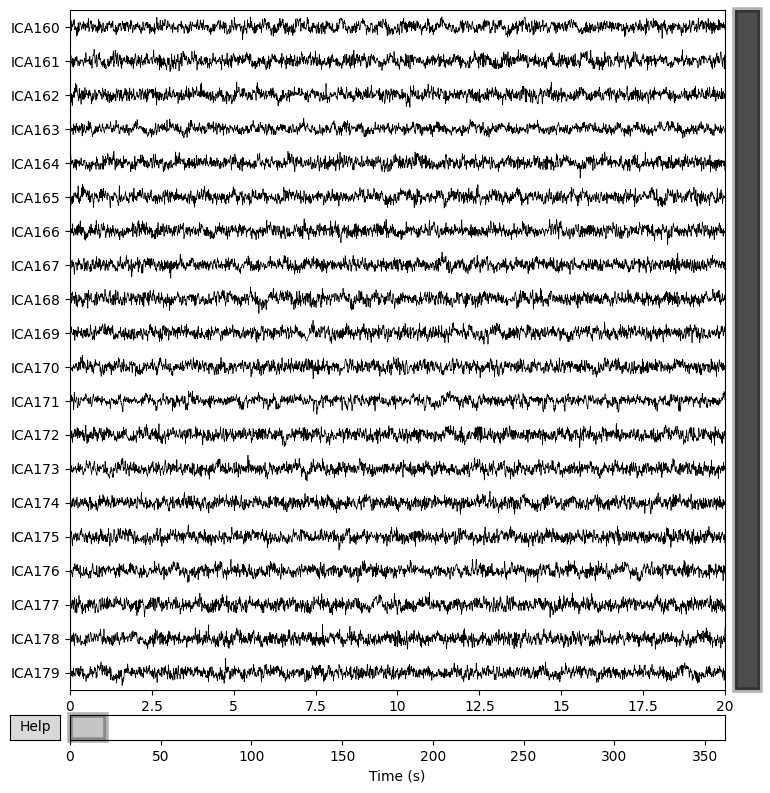

Displaying components 180-199
Creating RawArray with float64 data, n_channels=20, n_times=361000
    Range : 65000 ... 425999 =     65.000 ...   425.999 secs
Ready.


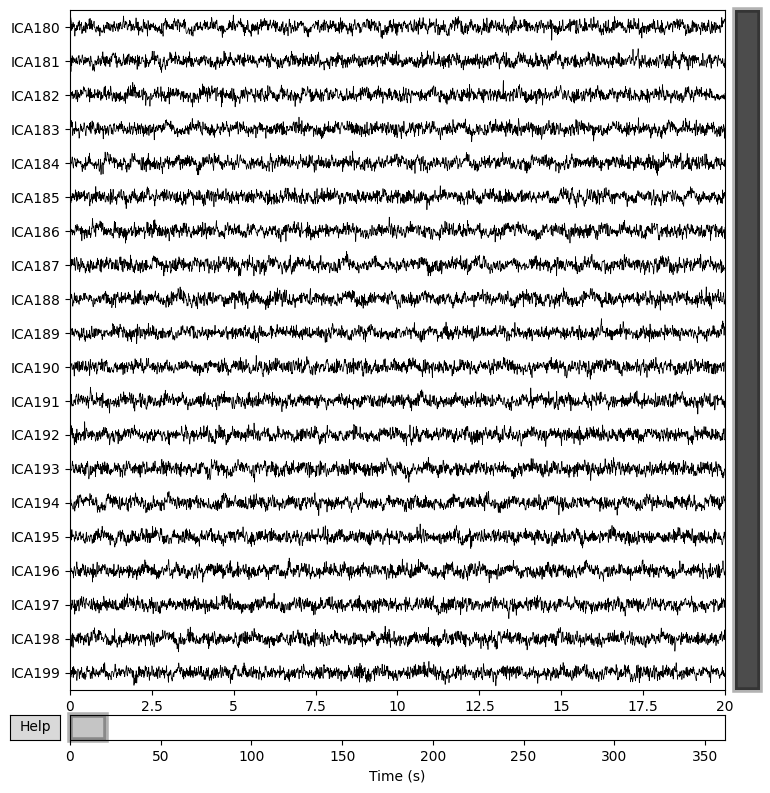

Displaying components 200-207
Creating RawArray with float64 data, n_channels=8, n_times=361000
    Range : 65000 ... 425999 =     65.000 ...   425.999 secs
Ready.


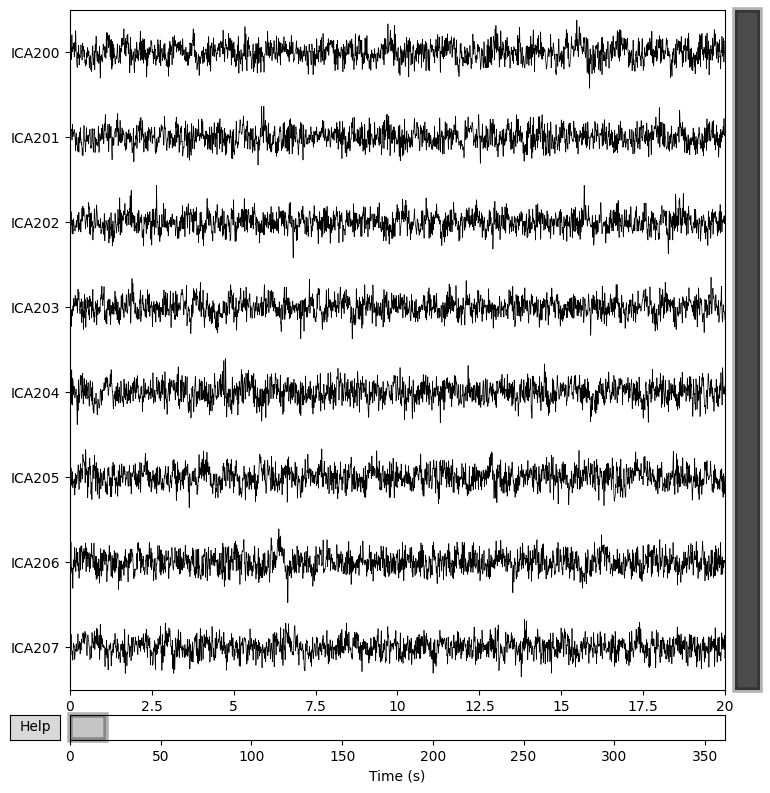

In [151]:
# Define batch size
batch_size = 20

# Loop through all components in batches
for start_pick in range(0, ica.n_components_, batch_size):
    end_pick = min(start_pick + batch_size, ica.n_components_)
    print(f"Displaying components {start_pick}-{end_pick-1}")
    ica.plot_sources(inst=filt_raw, picks=range(start_pick, end_pick))

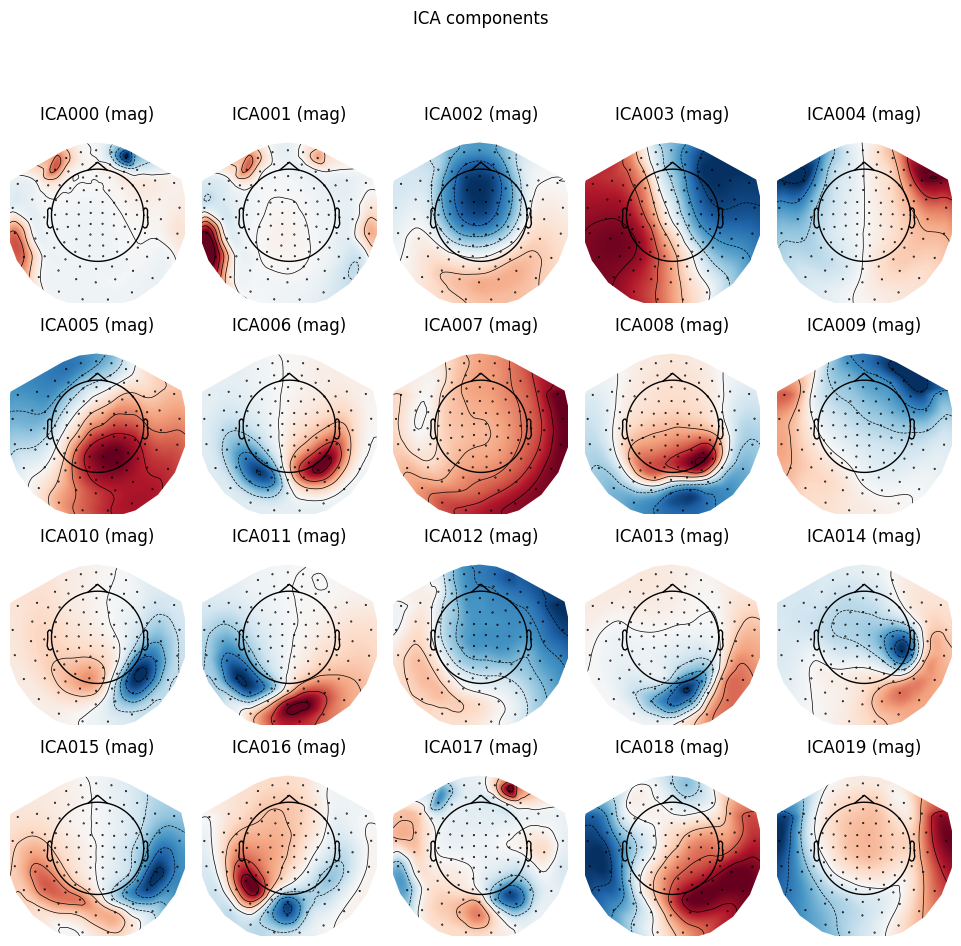

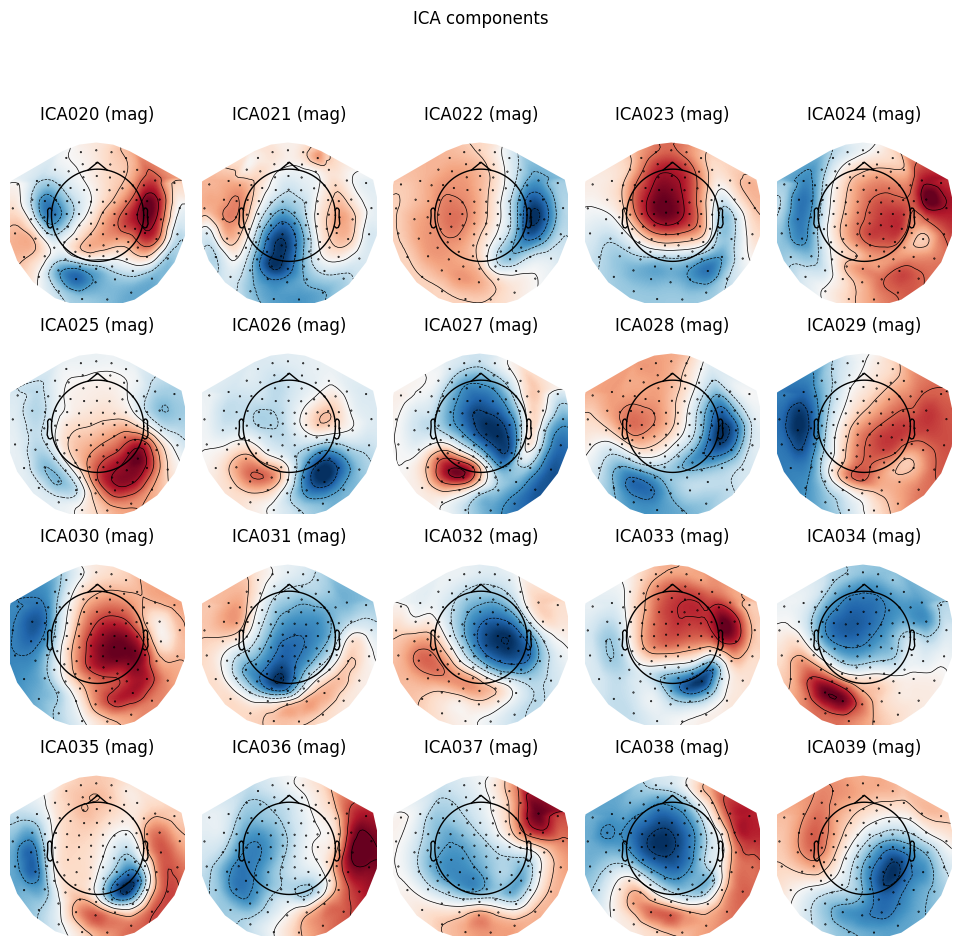

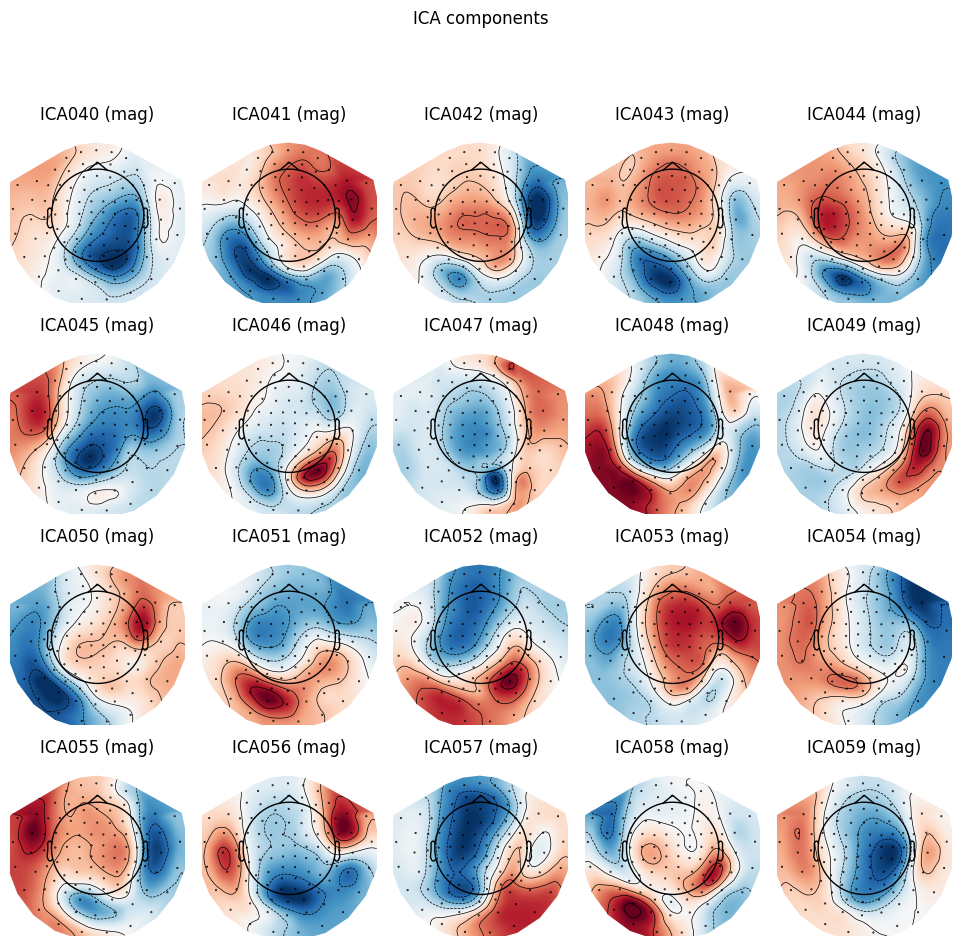

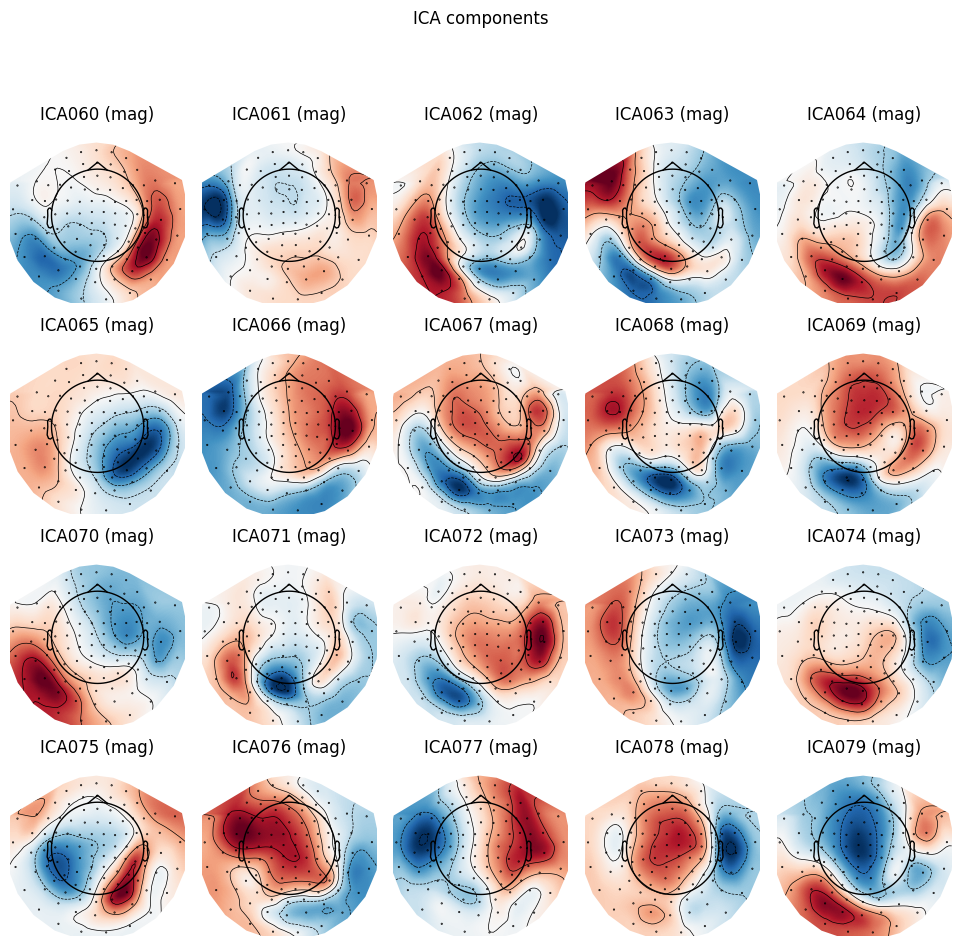

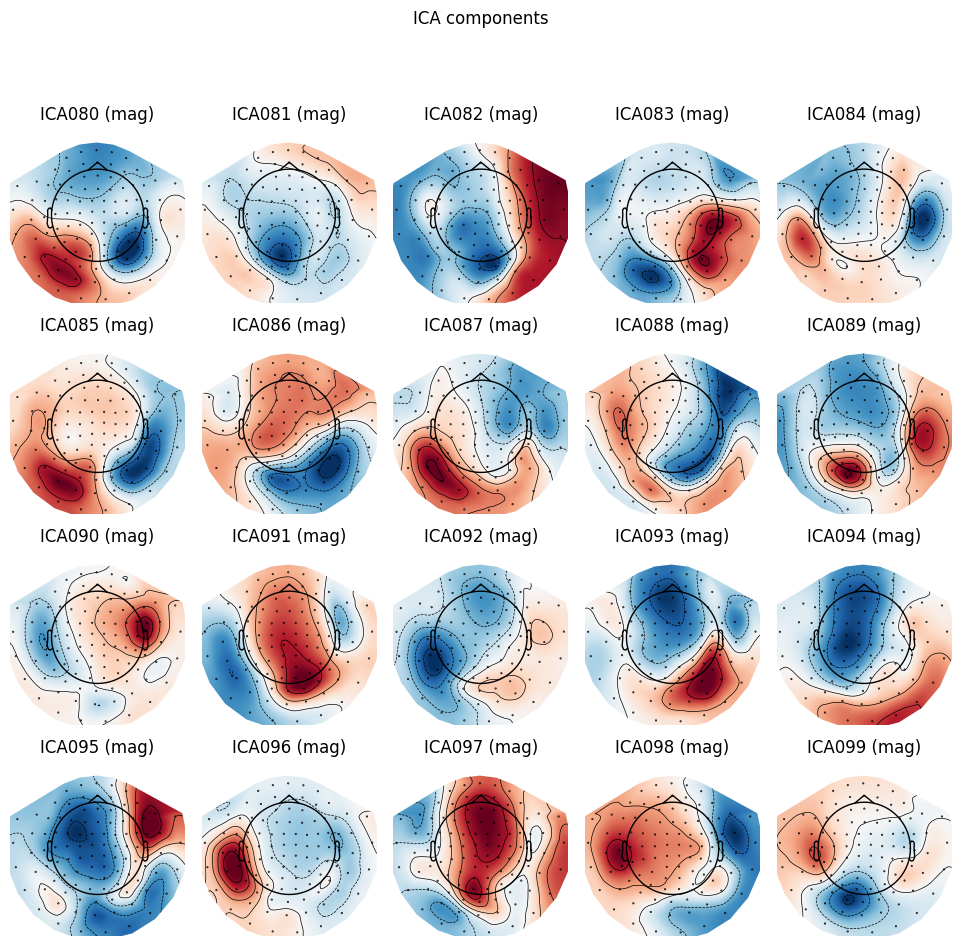

...

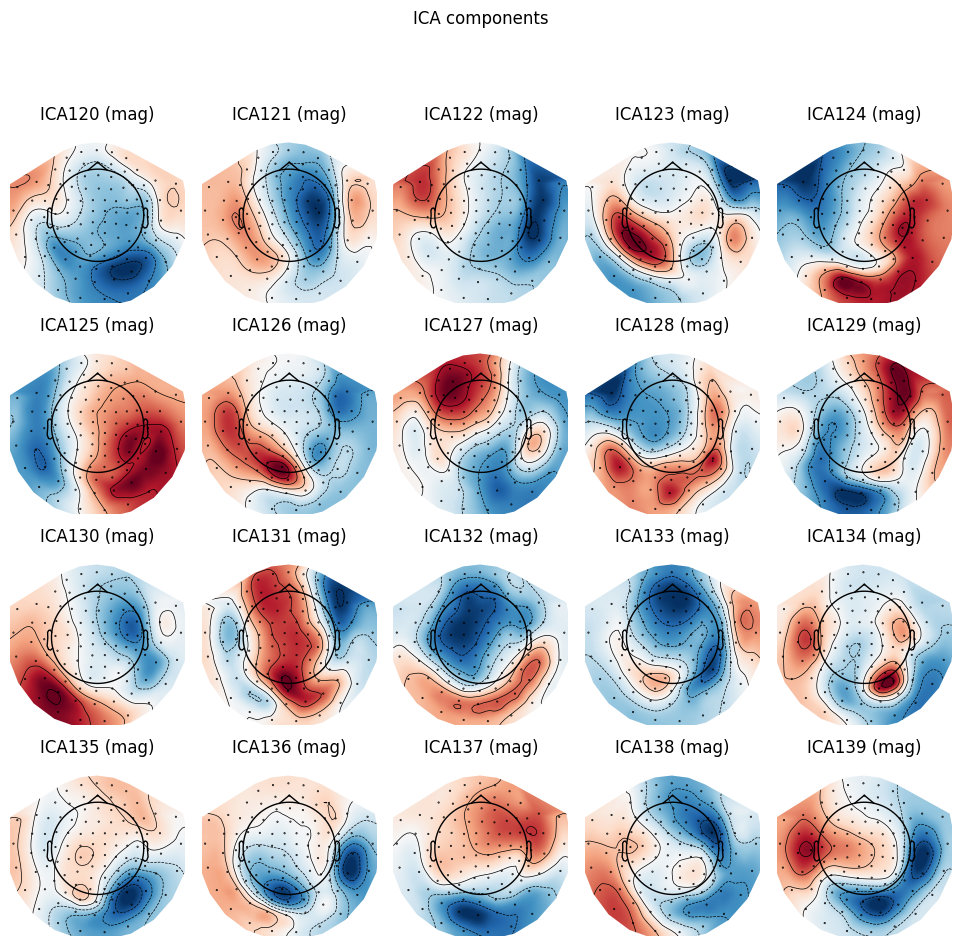

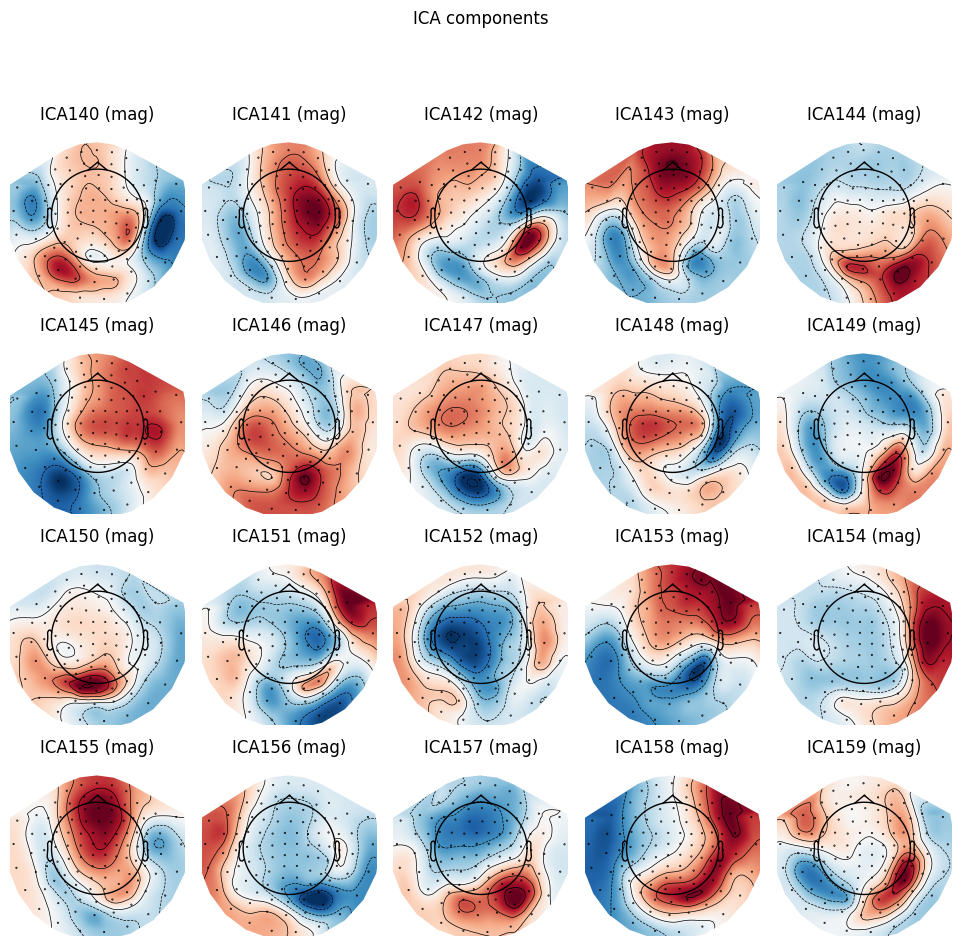

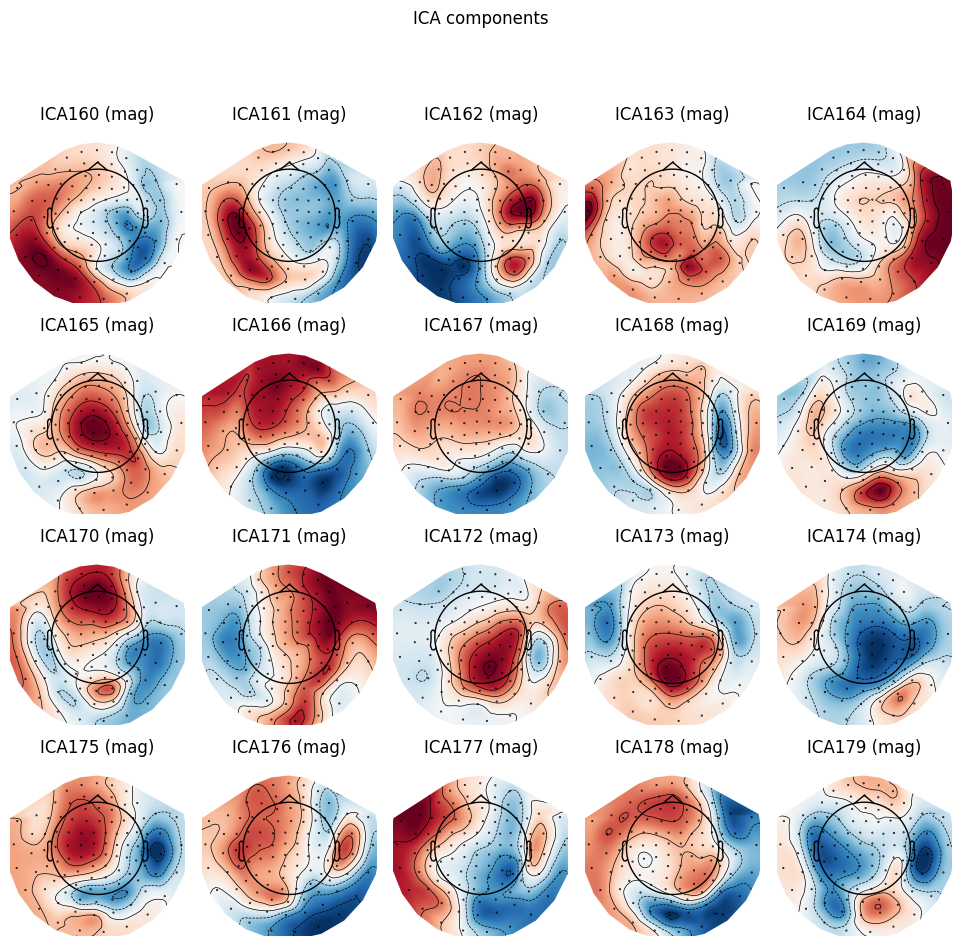

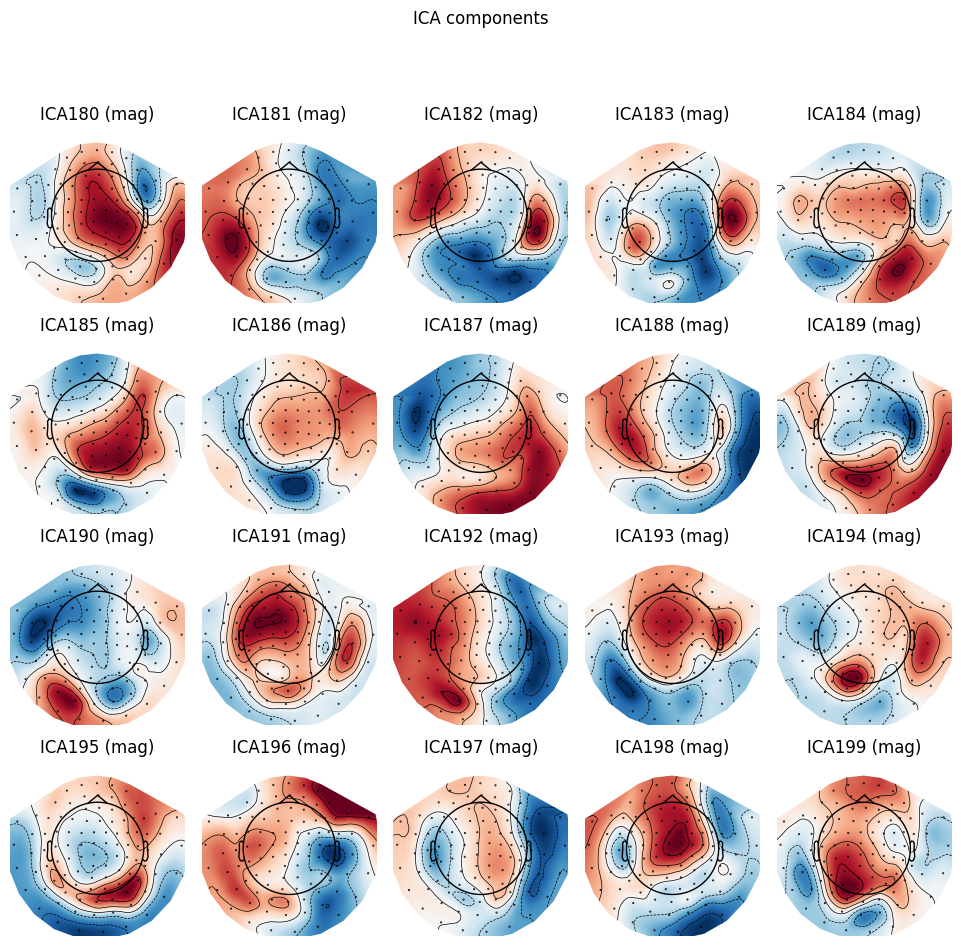

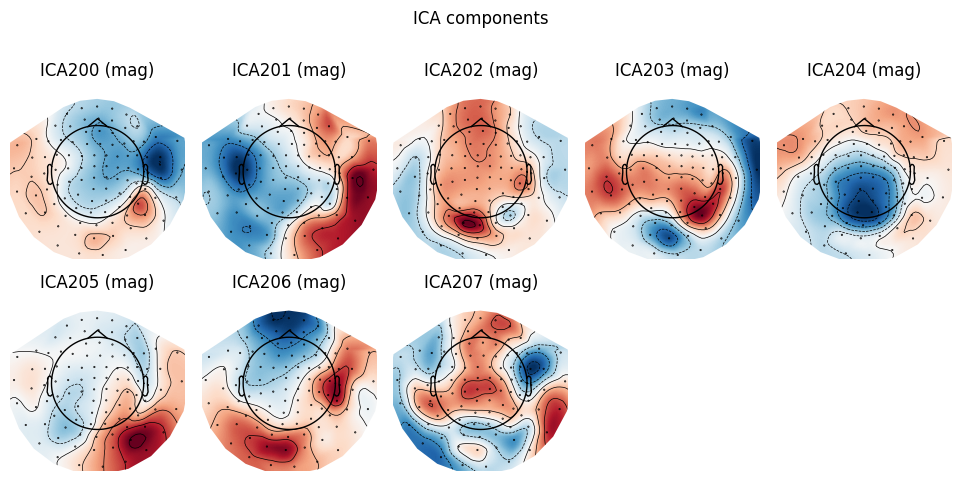

[<MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x496 with 8 Axes>]

In [152]:
ica.plot_components()

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
182 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
182 matching events found
No baseline correction applied
0 projection items activated
Not setting metadata
182 matching events found
No baseline correction applied
0 projection items activated


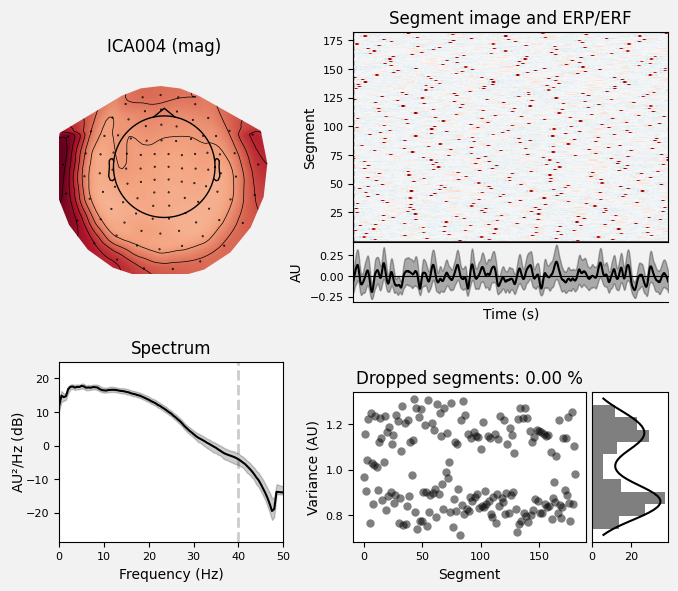

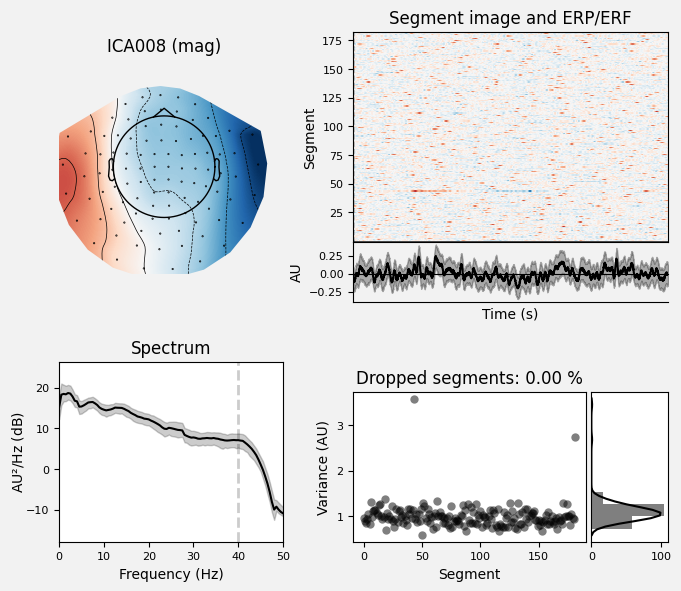

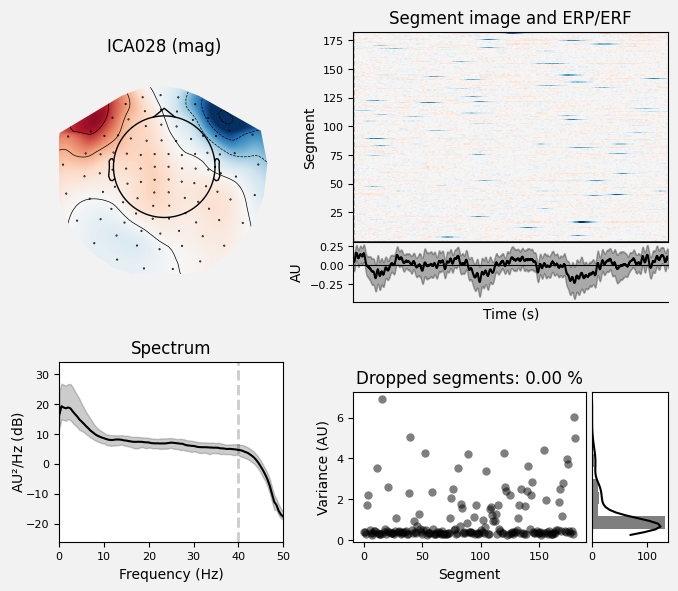

In [7]:
noise_components = [4, 8, 28]


# plot to check that you have the correct indices
ica.plot_properties(filt_raw, noise_components);

## SEND SUBJECT + RECORDING NAME AND INDICES OF NOISY COMPONENTS TO LAURA <33 Use below to print and copy

In [8]:
print(f"Subject: {subject}, recording: {recording_name}, noise components: {noise_components}")

Subject: 0108, recording: 001.self_block1, noise components: [4, 8, 28]
